In [1]:
%load_ext watermark
%watermark -a 'Navin Kumar M' -v -p sklearn,pandas,matplotlib,seaborn

Author: Navin Kumar M

Python implementation: CPython
Python version       : 3.10.12
IPython version      : 8.14.0

sklearn   : 1.2.0
pandas    : 1.5.3
matplotlib: 3.7.2
seaborn   : 0.12.2



### **Environment**

In [2]:
import sklearn as sk
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os
import folium
import optuna
import warnings
import lightgbm as lgbm
import json

from tqdm import tqdm
from sklearn.cluster import KMeans
from sklearn.model_selection import StratifiedKFold
from optuna.samplers import TPESampler
from sklearn.metrics import f1_score
from joblib import dump, load

%matplotlib inline

pd.set_option('display.max_rows', 10)
pd.set_option('display.max_columns', 50)

In [3]:
warnings.filterwarnings('ignore')
np.random.seed(42)

ROOT_FOLDER=os.path.abspath("../")
DATA_FOLDER=os.path.join(ROOT_FOLDER,"data")
MODEL_FOLDER=os.path.join(ROOT_FOLDER,"server" ,"models")
DATA_FOLDER

'/workspace/BI-Credibility-Prediction/data'

In [4]:
loan_outcomes_df = pd.read_csv(os.path.join(DATA_FOLDER,"loan_outcomes.csv")) # Loan Outcomes
user_attributes_df = pd.read_csv(os.path.join(DATA_FOLDER,"user_attributes.csv")) # User Attributes
user_gps_fixes = pd.read_csv(os.path.join(DATA_FOLDER,"user_gps_fixes.csv")) # User GPS Fixes

display(loan_outcomes_df.head())
display(user_attributes_df.head())
display(user_gps_fixes.head())

,user_id,application_at,loan_outcome
0,1,2017-08-14 09:08:50.000000,defaulted
1,2,2016-05-17 10:10:12.447976,repaid
2,3,2016-10-20 10:07:20.459081,defaulted
3,4,2017-01-13 13:03:34.000000,defaulted
4,5,2016-11-03 15:41:39.124610,repaid


,user_id,age,cash_incoming_30days
0,1,42,8988.12
1,2,36,9968.12
2,3,27,59.04
3,4,38,2129.03
4,5,33,2102.53


,id,gps_fix_at,server_upload_at,longitude,latitude,accuracy,altitude,bearing,location_provider,user_id
0,1,2017-06-22 09:37:20,2017-06-22 09:43:42,36.840540,-1.294342,68.4,0.0,0.0,fused,1
1,2,2017-08-14 07:50:27,2017-08-14 09:05:27,36.895270,-1.341928,1409.0,0.0,0.0,fused,1
2,3,2017-06-13 10:34:29,2017-06-13 10:54:48,36.811903,-1.307220,68.4,0.0,0.0,fused,1
3,4,2017-06-18 12:16:20,2017-06-18 12:16:24,36.907049,-1.309984,1581.0,0.0,0.0,fused,1
4,5,2017-06-28 09:39:08,2017-06-28 09:58:12,36.839396,-1.280310,1396.0,0.0,0.0,fused,1


#### **Geo-Spatial Data**

Idea:
- Converting the geo location data to a label by using the KMeans algorithm
- Using the label as a feature for the Main Model instead of the geo location data

In [5]:
df = user_gps_fixes[["latitude", "longitude"]].copy()
df.describe()

,latitude,longitude
count,26710.000000,26710.000000
mean,-1.031422,36.503743
std,1.850920,4.172315
min,-24.645763,-85.232791
25%,-1.299535,36.163351
50%,-1.232870,36.825059
75%,-0.402338,36.950463
max,56.242041,117.058355


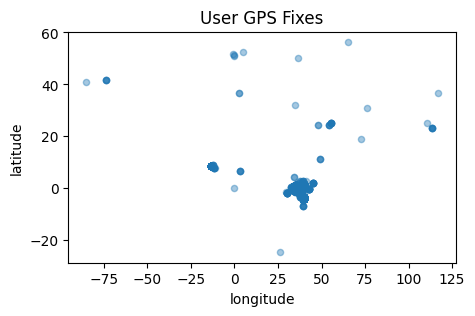

In [6]:

df.plot(kind="scatter", x="longitude", y="latitude", alpha=0.4, figsize=(5,3))
plt.title("User GPS Fixes")
plt.show()

#### **KMeans Clustering**

- Finding the optimal number of clusters : Elbow Method
- Iterating the same expeirement from (2, 10) , (11, 20), (20, 30) - For Better Visulaization

In [7]:
def plot_elbow_method(rng):
    wcss = []
    a, b = rng
    for i in tqdm(range(a,b)):
        model = KMeans(n_clusters=i)
        y_kmeans = model.fit_predict(df)
        wcss.append(model.inertia_)
    
    plt.plot(range(a, b), wcss)
    plt.xlabel('Number of clusters')
    plt.ylabel('Within cluster sum of squares')
    plt.title('Elbow Method')
    plt.show()

100%|██████████| 9/9 [00:22<00:00,  2.48s/it]


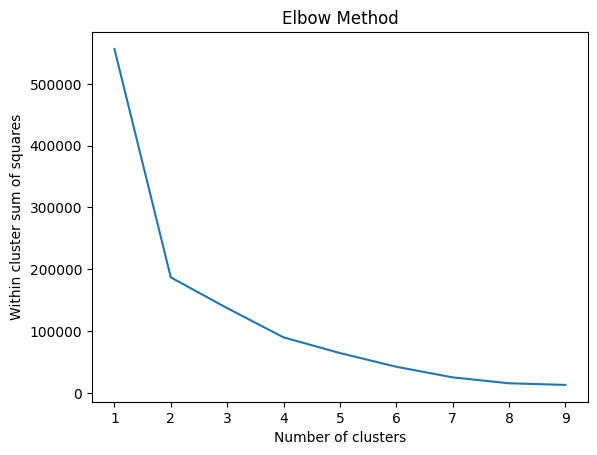

In [8]:
plot_elbow_method((1, 10))


100%|██████████| 10/10 [00:34<00:00,  3.45s/it]


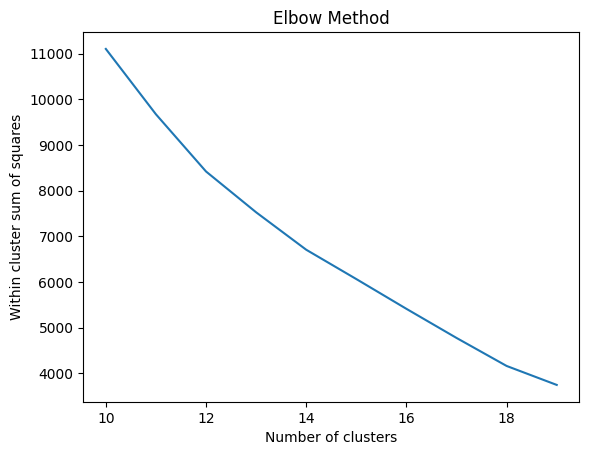

In [9]:
plot_elbow_method((10, 20))

100%|██████████| 10/10 [00:41<00:00,  4.17s/it]


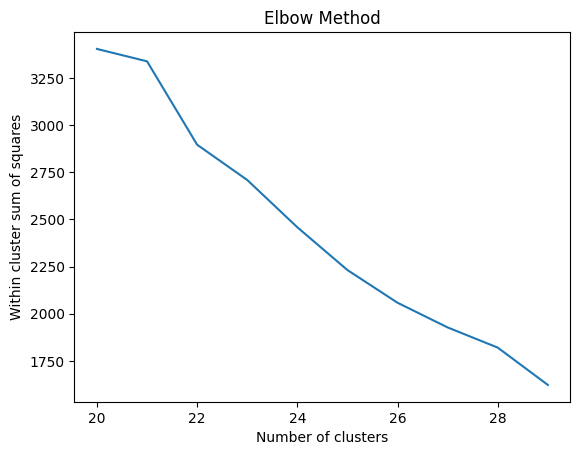

In [10]:
plot_elbow_method((20, 30))

- If we look at the position cluster [2, 4, 12, 24], there is a sharp decrease in the slope.    
    - if we cluster locations as two side of globe => 2
    - if we cluster locations as continents => 4
    - if we cluster locations as countries => 12,
    - if we cluster locations as sparse(countires) + dense(cities) => 24

- Most Reasonable intrepration is to cluster locations as countries/cities - so we will go with 24 (cities) as the number of clusters

#### **Modelling**

In [11]:
model = KMeans(n_clusters=24)
df['y'] = model.fit_predict(df)

dump(model, os.path.join(MODEL_FOLDER, "kmeans_model.joblib"))

cluster_count = df['y'].unique().shape[0]
cluster_count

24

In [12]:
clusters = []
for i in range(24):
    clusters.append(df[['latitude', "longitude"]][df['y'] == i].values.tolist())
  
map = folium.Map(
    location=[0, 0], 
    zoom_start=2, 
    tiles="openstreetmap", 
    min_zoom=2,
    max_zoom=2
)

# Define a list of distinct colors
distinct_colors = [
    '#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd',
    '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf',
    '#aec7e8', '#ffbb78', '#98df8a', '#ff9896', '#c5b0d5',
    '#c49c94', '#f7b6d2', '#c7c7c7', '#dbdb8d', '#9edae5',
    '#393b79', '#637939', '#af8dc3', '#7b4173',
]

for color, cluster in enumerate(clusters):
    for i in cluster:
        folium.CircleMarker(i, radius=2,color=distinct_colors[color],fill_color=color).add_to(map)
    
map


- Thus the longitue and latitude data is converted to a label using KMeans Clustering which is used as a feature for the main model

In [13]:
# change the original dataframe to include the cluster number
user_gps_fixes['cluster'] = df['y']
user_gps_fixes.head()

,id,gps_fix_at,server_upload_at,longitude,latitude,accuracy,altitude,bearing,location_provider,user_id,cluster
0,1,2017-06-22 09:37:20,2017-06-22 09:43:42,36.840540,-1.294342,68.4,0.0,0.0,fused,1,5
1,2,2017-08-14 07:50:27,2017-08-14 09:05:27,36.895270,-1.341928,1409.0,0.0,0.0,fused,1,5
2,3,2017-06-13 10:34:29,2017-06-13 10:54:48,36.811903,-1.307220,68.4,0.0,0.0,fused,1,5
3,4,2017-06-18 12:16:20,2017-06-18 12:16:24,36.907049,-1.309984,1581.0,0.0,0.0,fused,1,5
4,5,2017-06-28 09:39:08,2017-06-28 09:58:12,36.839396,-1.280310,1396.0,0.0,0.0,fused,1,5


#### **USER_GPS_FIXES**

In [14]:
df = user_gps_fixes.copy()
df.head()

,id,gps_fix_at,server_upload_at,longitude,latitude,accuracy,altitude,bearing,location_provider,user_id,cluster
0,1,2017-06-22 09:37:20,2017-06-22 09:43:42,36.840540,-1.294342,68.4,0.0,0.0,fused,1,5
1,2,2017-08-14 07:50:27,2017-08-14 09:05:27,36.895270,-1.341928,1409.0,0.0,0.0,fused,1,5
2,3,2017-06-13 10:34:29,2017-06-13 10:54:48,36.811903,-1.307220,68.4,0.0,0.0,fused,1,5
3,4,2017-06-18 12:16:20,2017-06-18 12:16:24,36.907049,-1.309984,1581.0,0.0,0.0,fused,1,5
4,5,2017-06-28 09:39:08,2017-06-28 09:58:12,36.839396,-1.280310,1396.0,0.0,0.0,fused,1,5


In [15]:
# null values in df
df.isnull().sum()

id                   0
gps_fix_at           0
server_upload_at     0
longitude            0
latitude             0
                    ..
altitude             0
bearing              0
location_provider    0
user_id              0
cluster              0
Length: 11, dtype: int64

**Understanding :**
-  gpu_fix_at : Login Time
-  server_upload_at : Logout Time
-  (latitude, longitude) : Location of the user at that time
-  user_id : User ID
-  accuracy : Accuracy of the GPS (in meters)
-  altitude : Altitude of the user (in meters)
-  bearing : Bearing of the user (in degrees)
-  location_provider : GPS Provider

**Consideration :**
- We should consider the events(gps_fix_at, server_upload_at) which are were happened before the application was submitted. since during inference we only get the past events not the future ones. Therefore we need to filter the events which are happened after the application was submitted.

- (gps_fix_at, server_upload_at) this time interval changes from a minute to hours... for this project, we are neglecting the skewness caused by the outliers. Because we dont want to lose the other features attached to it. Futher it can also be used for anomaly detection and remove those outliers. 

**Approach :**
- Data Modelling the distribution of the Time Related Data

**Findings :**
- Change in Atitute means the user is went to a vacation or a trip
- Change in Bearing means the user is travelling
- So when there is So bearing and atitude change in a short period of time, it means the user is having a trip
- General Point of View : If a person goes for lots of trips, he is more likely to be a credible person for a loan

##### **Location Providers**

In [16]:
# Label Encode 'location_provider'
unique_location_providers = list(df['location_provider'].unique())
unique_location_providers  # ['fused', 'gps', 'network', 'local_database']

df = df.replace({'location_provider': {'fused': 0, 'gps': 1, 'network': 2, 'local_database': 3}})
df.head()

,id,gps_fix_at,server_upload_at,longitude,latitude,accuracy,altitude,bearing,location_provider,user_id,cluster
0,1,2017-06-22 09:37:20,2017-06-22 09:43:42,36.840540,-1.294342,68.4,0.0,0.0,0,1,5
1,2,2017-08-14 07:50:27,2017-08-14 09:05:27,36.895270,-1.341928,1409.0,0.0,0.0,0,1,5
2,3,2017-06-13 10:34:29,2017-06-13 10:54:48,36.811903,-1.307220,68.4,0.0,0.0,0,1,5
3,4,2017-06-18 12:16:20,2017-06-18 12:16:24,36.907049,-1.309984,1581.0,0.0,0.0,0,1,5
4,5,2017-06-28 09:39:08,2017-06-28 09:58:12,36.839396,-1.280310,1396.0,0.0,0.0,0,1,5


##### **Cluster x UserID**

In [17]:
# correlation 
unique_clusters = df.groupby('user_id')['cluster'].nunique().reset_index()    
unique_clusters['cluster'].value_counts()

1    185
2     91
3     49
4     28
5     15
6      4
Name: cluster, dtype: int64

Correlation between user_id and cluster
-  Expected: 
    Mostly user stays in the same cluster (city/country) and occasionally moves to other cluster (city/country)
-  Actual:
    In their entire users past they were in 1-6 clusters(locations) usually

#### **Time Data Modelling**

In [18]:
def feature_extraction(df):
    df['gps_fix_at'] = pd.to_datetime(df['gps_fix_at'])
    df['server_upload_at'] = pd.to_datetime(df['server_upload_at'])
    
    
    df = df.sort_values(by=['gps_fix_at'])  
    df = (df[
        df['gps_fix_at'] < loan_outcomes_df[
            loan_outcomes_df['user_id'] == df['user_id']
            .iloc[0]
            ]
        ['application_at'].iloc[0]])

    if df is None or df.empty:
        return None

    # time difference calc
    df['time_in_out_diff'] = (df['server_upload_at'] - df['gps_fix_at']).dt.total_seconds()
    df['time_gps_fix_shift'] = df['gps_fix_at'].diff().dt.total_seconds()    
    df['time_gps_fix_shift'] = df['time_gps_fix_shift'].fillna(0)
    df['gps_first_server_last_diff'] = (df['server_upload_at'].iloc[-1] - df['gps_fix_at'].iloc[0]).days  
    
    # count location_provider
    location_provider_count = dict(df['location_provider'].value_counts())
    df['location_provider_count_fused'] = location_provider_count.get(0, 0)
    df['location_provider_count_gps'] = location_provider_count.get(1, 0)
    df['location_provider_count_network'] = location_provider_count.get(2, 0)
    df['location_provider_count_local_database'] = location_provider_count.get(3, 0)
    
    # altitude
    zero_count = (df['altitude'] == 0).sum()
    non_zero_count = (df['altitude'] != 0).sum()
    # [0 => city native, 1 => hilly native]
    df['altitude_native'] = 0 if zero_count > non_zero_count else 1
    df['num_travels'] = (df['bearing'] != 0).sum()
    
    # drop "gpu_fix_at", "server_upload_at" columns
    df.drop(columns=["gps_fix_at", "server_upload_at"], inplace=True)
    return df

df = df.groupby('user_id').apply(feature_extraction).reset_index(drop=True)
df.head()

,id,longitude,latitude,accuracy,altitude,bearing,location_provider,user_id,cluster,time_in_out_diff,time_gps_fix_shift,gps_first_server_last_diff,location_provider_count_fused,location_provider_count_gps,location_provider_count_network,location_provider_count_local_database,altitude_native,num_travels
0,19,36.918422,-1.290253,34.500,0.0,0.0,0,1,5,7.0,0.0,202,68,0,0,0,0,3
1,44,36.916207,-1.325239,36.000,0.0,0.0,0,1,5,11.0,946.0,202,68,0,0,0,0,3
2,50,36.906284,-1.319368,37.500,0.0,0.0,0,1,5,46.0,5733.0,202,68,0,0,0,0,3
3,69,36.903354,-1.331759,39.000,0.0,0.0,0,1,5,68.0,31266.0,202,68,0,0,0,0,3
4,6,36.878682,-1.320253,19.182,0.0,0.0,0,1,5,26.0,924282.0,202,68,0,0,0,0,3


In [19]:
def aggregate_dataframe(df):
    # Handle NaN values
    df = df.fillna(0)

    # Define custom aggregation functions
    def max_(x):
        return np.max(x)
    def min_(x):
        return np.min(x)
    def std_(x):
        return np.std(x) if len(x) > 1 else 0
    def mean_(x):
        return np.mean(x)
    def _(x):
        return int(np.mean(x))

    aggregations = {
        'time_in_out_diff': [max_, min_, std_, mean_],
        'time_gps_fix_shift': [max_, std_, mean_],
        'longitude': [std_],
        'latitude': [std_],
        'altitude': [mean_, std_],
        'bearing': [mean_, std_],
        'location_provider_count_fused': [_],
        'location_provider_count_gps': [_],
        'location_provider_count_network': [_],
        'location_provider_count_local_database': [_],
        'altitude_native': [_],
        'num_travels': [_],
    }

    grouped = df.groupby('user_id')
    df_agg = grouped.agg(aggregations).reset_index()

    # Count occurrences of each cluster for each user_id
    for i in range(24):
        df_agg[f'cluster_{i}_count'] = df.groupby('user_id')['cluster'].apply(lambda x: (x == i).sum()).values

    # Join the multi-level column index into a single-level index
    df_agg.columns = ['_'.join(col).strip() for col in df_agg.columns.values]
    df_agg.rename(columns={'user_id_': 'user_id'}, inplace=True)
    return df_agg

df_agg = aggregate_dataframe(df)
df_agg.head()



,user_id,time_in_out_diff_max_,time_in_out_diff_min_,time_in_out_diff_std_,time_in_out_diff_mean_,time_gps_fix_shift_max_,time_gps_fix_shift_std_,time_gps_fix_shift_mean_,longitude_std_,latitude_std_,altitude_mean_,altitude_std_,bearing_mean_,bearing_std_,location_provider_count_fused__,location_provider_count_gps__,location_provider_count_network__,location_provider_count_local_database__,altitude_native__,num_travels__,cluster_0_count_,cluster_1_count_,cluster_2_count_,cluster_3_count_,cluster_4_count_,cluster_5_count_,cluster_6_count_,cluster_7_count_,cluster_8_count_,cluster_9_count_,cluster_10_count_,cluster_11_count_,cluster_12_count_,cluster_13_count_,cluster_14_count_,cluster_15_count_,cluster_16_count_,cluster_17_count_,cluster_18_count_,cluster_19_count_,cluster_20_count_,cluster_21_count_,cluster_22_count_,cluster_23_count_
0,1,6735.0,3.0,1381.001488,1004.911765,2500860.0,4.465555e+05,2.568136e+05,0.546530,0.536375,77.916176,327.991203,8.455882,41.61357,68,0,0,0,0,3,0,0,0,0,0,61,2,0,0,0,0,0,0,0,0,0,1,0,0,0,3,0,0,1
1,2,1.0,1.0,0.000000,1.000000,0.0,0.000000e+00,0.000000e+00,0.000000,0.000000,-23.000000,0.000000,-1.000000,0.00000,0,1,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,3,12.0,12.0,0.000000,12.000000,0.0,0.000000e+00,0.000000e+00,0.000000,0.000000,2190.900000,0.000000,273.620000,0.00000,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
3,4,83.0,83.0,0.000000,83.000000,0.0,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
4,5,247.0,1.0,106.095181,63.250000,9098135.0,3.939527e+06,2.274675e+06,0.025476,0.015027,1215.925500,702.599111,113.058750,115.65520,1,3,0,0,1,3,0,0,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [20]:
400-len(df_agg), len(df_agg[df_agg['time_in_out_diff_std_'] == 0])

(43, 20)

- As you can see above almost 40 users have no history and 20 users have only 1 day as an history.
- For users with 1 history, std columns will be 0 all other features will be almost same
- For users with no history, we need to develop new model to predict the credibility

In [21]:
# join df_agg with user_attributes_df on user_id left join
df_with_history = df_agg.merge(user_attributes_df, on='user_id', how='left')
df_with_history.head()

,user_id,time_in_out_diff_max_,time_in_out_diff_min_,time_in_out_diff_std_,time_in_out_diff_mean_,time_gps_fix_shift_max_,time_gps_fix_shift_std_,time_gps_fix_shift_mean_,longitude_std_,latitude_std_,altitude_mean_,altitude_std_,bearing_mean_,bearing_std_,location_provider_count_fused__,location_provider_count_gps__,location_provider_count_network__,location_provider_count_local_database__,altitude_native__,num_travels__,cluster_0_count_,cluster_1_count_,cluster_2_count_,cluster_3_count_,cluster_4_count_,cluster_5_count_,cluster_6_count_,cluster_7_count_,cluster_8_count_,cluster_9_count_,cluster_10_count_,cluster_11_count_,cluster_12_count_,cluster_13_count_,cluster_14_count_,cluster_15_count_,cluster_16_count_,cluster_17_count_,cluster_18_count_,cluster_19_count_,cluster_20_count_,cluster_21_count_,cluster_22_count_,cluster_23_count_,age,cash_incoming_30days
0,1,6735.0,3.0,1381.001488,1004.911765,2500860.0,4.465555e+05,2.568136e+05,0.546530,0.536375,77.916176,327.991203,8.455882,41.61357,68,0,0,0,0,3,0,0,0,0,0,61,2,0,0,0,0,0,0,0,0,0,1,0,0,0,3,0,0,1,42,8988.12
1,2,1.0,1.0,0.000000,1.000000,0.0,0.000000e+00,0.000000e+00,0.000000,0.000000,-23.000000,0.000000,-1.000000,0.00000,0,1,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,36,9968.12
2,3,12.0,12.0,0.000000,12.000000,0.0,0.000000e+00,0.000000e+00,0.000000,0.000000,2190.900000,0.000000,273.620000,0.00000,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,27,59.04
3,4,83.0,83.0,0.000000,83.000000,0.0,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,38,2129.03
4,5,247.0,1.0,106.095181,63.250000,9098135.0,3.939527e+06,2.274675e+06,0.025476,0.015027,1215.925500,702.599111,113.058750,115.65520,1,3,0,0,1,3,0,0,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,33,2102.53


In [22]:
# find each column with no of unique values
for col in df_with_history.columns:
    print(f"{col} => {df_with_history[col].nunique()}")

user_id => 357
time_in_out_diff_max_ => 326
time_in_out_diff_min_ => 122
time_in_out_diff_std_ => 336
time_in_out_diff_mean_ => 349
time_gps_fix_shift_max_ => 336
time_gps_fix_shift_std_ => 336
time_gps_fix_shift_mean_ => 336
longitude_std_ => 340
latitude_std_ => 340
altitude_mean_ => 252
altitude_std_ => 241
bearing_mean_ => 202
bearing_std_ => 196
location_provider_count_fused__ => 98
location_provider_count_gps__ => 23
location_provider_count_network__ => 40
location_provider_count_local_database__ => 1
altitude_native__ => 2
num_travels__ => 52
cluster_0_count_ => 21
cluster_1_count_ => 1
cluster_2_count_ => 32
cluster_3_count_ => 3
cluster_4_count_ => 1
cluster_5_count_ => 86
cluster_6_count_ => 26
cluster_7_count_ => 4
cluster_8_count_ => 2
cluster_9_count_ => 3
cluster_10_count_ => 23
cluster_11_count_ => 2
cluster_12_count_ => 1
cluster_13_count_ => 3
cluster_14_count_ => 2
cluster_15_count_ => 2
cluster_16_count_ => 19
cluster_17_count_ => 1
cluster_18_count_ => 2
cluster_19_

- Note: Because of insufficient data, cluster 2, 3, 16 no of values were 1. More data should be collected to deal with this. Removing this feature or adding this feature for model, both will be a bad idea.
- Simillarly for location_provider_count_local_databse

In [23]:
df_without_history = user_attributes_df[~user_attributes_df['user_id'].isin(df_with_history['user_id'])]
df_without_history.head()

,user_id,age,cash_incoming_30days
6,7,28,2726.06
17,18,53,2234.82
24,25,50,1592.98
27,28,65,3219.04
28,29,30,19743.76


- defaulted => 0 
- repaid => 1

In [24]:
loan_outcomes_df.drop(columns=['application_at'], inplace=True)
loan_outcomes_df['loan_outcome'] = loan_outcomes_df['loan_outcome'].replace({'defaulted': 0, 'repaid': 1})
loan_outcomes_df.head()

,user_id,loan_outcome
0,1,0
1,2,1
2,3,0
3,4,0
4,5,1


In [25]:
# merge df_with_history with loan_outcomes
df_with_history = df_with_history.merge(loan_outcomes_df, on='user_id', how='left')
df_with_history.head()


,user_id,time_in_out_diff_max_,time_in_out_diff_min_,time_in_out_diff_std_,time_in_out_diff_mean_,time_gps_fix_shift_max_,time_gps_fix_shift_std_,time_gps_fix_shift_mean_,longitude_std_,latitude_std_,altitude_mean_,altitude_std_,bearing_mean_,bearing_std_,location_provider_count_fused__,location_provider_count_gps__,location_provider_count_network__,location_provider_count_local_database__,altitude_native__,num_travels__,cluster_0_count_,cluster_1_count_,cluster_2_count_,cluster_3_count_,cluster_4_count_,cluster_5_count_,cluster_6_count_,cluster_7_count_,cluster_8_count_,cluster_9_count_,cluster_10_count_,cluster_11_count_,cluster_12_count_,cluster_13_count_,cluster_14_count_,cluster_15_count_,cluster_16_count_,cluster_17_count_,cluster_18_count_,cluster_19_count_,cluster_20_count_,cluster_21_count_,cluster_22_count_,cluster_23_count_,age,cash_incoming_30days,loan_outcome
0,1,6735.0,3.0,1381.001488,1004.911765,2500860.0,4.465555e+05,2.568136e+05,0.546530,0.536375,77.916176,327.991203,8.455882,41.61357,68,0,0,0,0,3,0,0,0,0,0,61,2,0,0,0,0,0,0,0,0,0,1,0,0,0,3,0,0,1,42,8988.12,0
1,2,1.0,1.0,0.000000,1.000000,0.0,0.000000e+00,0.000000e+00,0.000000,0.000000,-23.000000,0.000000,-1.000000,0.00000,0,1,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,36,9968.12,1
2,3,12.0,12.0,0.000000,12.000000,0.0,0.000000e+00,0.000000e+00,0.000000,0.000000,2190.900000,0.000000,273.620000,0.00000,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,27,59.04,0
3,4,83.0,83.0,0.000000,83.000000,0.0,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,38,2129.03,0
4,5,247.0,1.0,106.095181,63.250000,9098135.0,3.939527e+06,2.274675e+06,0.025476,0.015027,1215.925500,702.599111,113.058750,115.65520,1,3,0,0,1,3,0,0,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,33,2102.53,1


In [26]:
df_without_history = df_without_history.merge(loan_outcomes_df, on='user_id', how='left')
df_without_history.head()

,user_id,age,cash_incoming_30days,loan_outcome
0,7,28,2726.06,1
1,18,53,2234.82,0
2,25,50,1592.98,1
3,28,65,3219.04,0
4,29,30,19743.76,1


In [27]:
len(df_with_history), len(df_without_history)

(357, 43)

#### **Modelling Two Models : Lightgbm**

- Since there are only 40 data columns (less amount of data) in df_without_history, modelling will easily overfit the data. So we are only modelling the data with history

In [28]:
train_df = df_with_history
FEATURES = df_with_history.columns.tolist()
FEATURES.remove('user_id')
FEATURES.remove('loan_outcome')
TARGET = 'loan_outcome' 

<Axes: >

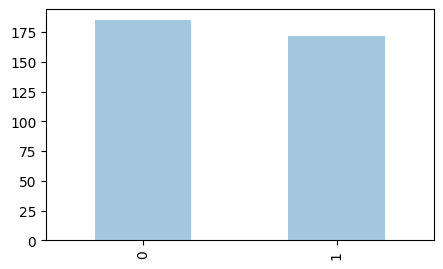

In [29]:
train_df['loan_outcome'].value_counts().plot(kind="bar", x="loan_outcome", y="user_id", alpha=0.4, figsize=(5,3))

- Balanced Class Dataset => Accuracy can be used as a metric
But i am going with F1 score, its better for generalization

In [30]:
max_score = 0
data_importance = []
def objective_lgbm(trial, lgbm_params=None, features=FEATURES):
    global max_score
    global data_importance
    global train_df
    models = {}
    results = [[[], []]]
    skf = StratifiedKFold(n_splits=5)
    save = 1

    early_stopping_callback = lgbm.early_stopping(stopping_rounds=75, verbose=False)
    log_evaluation_callback = lgbm.log_evaluation(period=0)
    callbacks = [early_stopping_callback, log_evaluation_callback]
    if lgbm_params is None:
        save = 0
        lgbm_params = {
            'objective': trial.suggest_categorical('objective',['binary']),
            'metric': trial.suggest_categorical('metric', ['binary_logloss']),
            'boosting_type':  trial.suggest_categorical('boosting_type', ['gbdt']),
            'num_iterations': trial.suggest_int('num_iterations', 300, 1000),
            'learning_rate': trial.suggest_float('learning_rate', 0.001, 0.005),
            'random_seed': trial.suggest_int('random_seed', 42, 42),
            'num_leaves': trial.suggest_int('num_leaves', 10, 30),
            'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.5),
            'subsample': trial.suggest_float('subsample', 0.1, 1),
            'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),
            'reg_alpha': trial.suggest_float('reg_alpha', 0.001, 10.0),
            'reg_lambda': trial.suggest_float('reg_lambda', 0.001, 10.0),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.1, 1.0),
            'min_split_gain': trial.suggest_float('min_split_gain', 0.001, 1.0),
            'max_depth': trial.suggest_int('max_depth', -1, 10),
        }

    feature_importance_df = pd.DataFrame()

    # Stratified K Flod
    for fold, (train_idx, valid_idx) in enumerate(
        skf.split(X=train_df[features], y=train_df[train_df.columns[-1]])):

        X_train, y_train = train_df[features].iloc[train_idx], train_df[TARGET].iloc[train_idx]
        X_valid, y_valid = train_df[features].iloc[valid_idx], train_df[TARGET].iloc[valid_idx]

        model = lgbm.LGBMClassifier(**lgbm_params)
        category = []
        for i in features:
            if isinstance(i, int):
                category.append(i)

        model.fit(X_train, y_train, eval_set=[(X_valid, y_valid)], eval_metric='binary_logloss', callbacks=callbacks,
                  categorical_feature=category,)

        y_hat = model.predict_proba(X_valid)[:,1]
        models[fold] = model

        fold_importance_df = pd.DataFrame()
        fold_importance_df["feature"] = train_df[features].columns
        fold_importance_df["importance"] = model.feature_importances_
        fold_importance_df["fold"] = fold + 1
        feature_importance_df = pd.concat([feature_importance_df, fold_importance_df], axis=0)

        results[0][0].append(y_valid)
        results[0][1].append(y_hat)
    
    feature_importance_df = feature_importance_df.groupby(['feature'])['importance'].agg(['mean']).sort_values(by='mean', ascending=False)
    display(feature_importance_df)
    results = [[np.concatenate(_) for _ in _] for _ in results]
    
    if save:
        fold = np.random.choice(list(models.keys()))
        model = models[fold]
        dump(model, os.path.join(MODEL_FOLDER, f"lgbm.joblib"))


    true = pd.DataFrame(results[0][0])
    
    oof = pd.DataFrame(results[0][1])
    
    scores = []; thresholds = []
    best_score = 0; best_threshold = 0

    for threshold in np.arange(0.3, 0.7, 0.01):
        preds = (oof.values.reshape(-1) > threshold).astype('int')
        m = f1_score(true.values.reshape(-1), preds, average='macro')
        scores.append(m)
        thresholds.append(threshold)
        if m > best_score:
            best_score = m
            best_threshold = threshold

    plt.figure(figsize=(20, 5))
    plt.plot(thresholds, scores, '-o', color='blue')
    plt.scatter([best_threshold], [best_score], color='blue')
    plt.xlabel("Threshold", size=14)
    plt.ylabel("Validation F1 Score",size=14)
    plt.title(f'Threshold vs. F1_Score with Best F1_Score={best_score:.3f} at Best Threshold = {best_threshold:.3}', size=18)
    plt.show()

    print(f'When using optimal threshold = {best_threshold:.2f}...')
    for k in range(1):
        m = f1_score(true[k].values, (oof[k].values > best_threshold).astype('int'), average='macro')
        print(f'Q{k}: F1 =',m)
    m = f1_score(true.values.reshape(-1), (oof.values > best_threshold).reshape(-1).astype('int'), average='macro')
    print('==> Overall F1 =', m)
    print('s')

    if save:
        return models

    if max_score < m:
        max_score = m

    return m

[I 2023-09-23 05:50:49,220] A new study created in memory with name: no-name-ac05023d-383e-4adb-99f4-346fc142b1c5


  0%|          | 0/10 [00:00<?, ?it/s]

,mean
feature,
age,791.4
cash_incoming_30days,381.6
time_gps_fix_shift_max_,336.2
longitude_std_,126.8
latitude_std_,112.2
...,...
cluster_21_count_,0.0
cluster_20_count_,0.0
cluster_1_count_,0.0


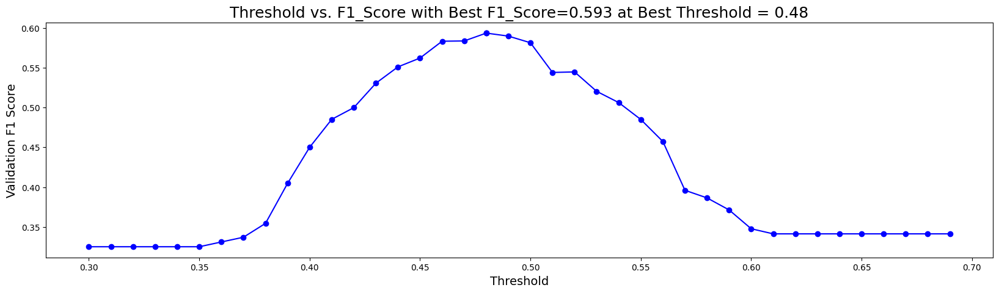

When using optimal threshold = 0.48...
Q0: F1 = 0.5933781076941205
==> Overall F1 = 0.5933781076941205
s
[I 2023-09-23 05:53:15,925] Trial 0 finished with value: 0.5933781076941205 and parameters: {'objective': 'binary', 'metric': 'binary_logloss', 'boosting_type': 'gbdt', 'num_iterations': 840, 'learning_rate': 0.001083007797437606, 'random_seed': 42, 'num_leaves': 23, 'subsample': 0.7739234942847507, 'min_child_samples': 52, 'reg_alpha': 2.248741658662946, 'reg_lambda': 1.9814305847314801, 'colsample_bytree': 0.7844776409790628, 'min_split_gain': 0.1699417257259729, 'max_depth': 0}. Best is trial 0 with value: 0.5933781076941205.


,mean
feature,
age,161.8
cash_incoming_30days,47.2
latitude_std_,4.2
location_provider_count_fused__,4.0
longitude_std_,2.8
...,...
cluster_19_count_,0.0
cluster_1_count_,0.0
cluster_20_count_,0.0


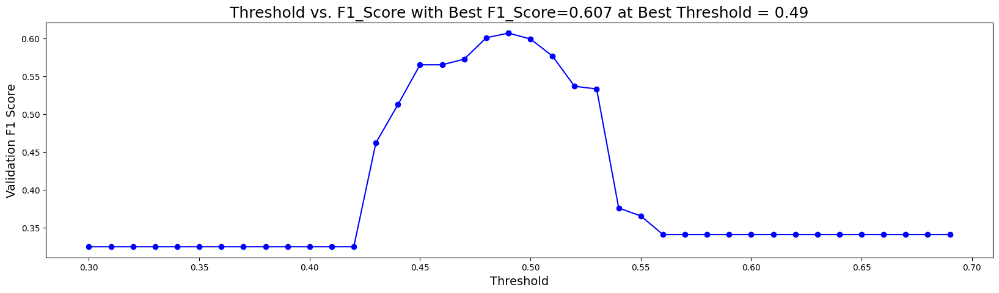

When using optimal threshold = 0.49...
Q0: F1 = 0.6071495944161479
==> Overall F1 = 0.6071495944161479
s
[I 2023-09-23 05:53:55,565] Trial 1 finished with value: 0.6071495944161479 and parameters: {'objective': 'binary', 'metric': 'binary_logloss', 'boosting_type': 'gbdt', 'num_iterations': 780, 'learning_rate': 0.004813573384779746, 'random_seed': 42, 'num_leaves': 10, 'subsample': 0.5609730370471989, 'min_child_samples': 83, 'reg_alpha': 6.125648142227052, 'reg_lambda': 7.217831419000564, 'colsample_bytree': 0.3626884613535699, 'min_split_gain': 0.9178563483904305, 'max_depth': 7}. Best is trial 1 with value: 0.6071495944161479.


,mean
feature,
age,652.0
cash_incoming_30days,301.0
latitude_std_,67.6
time_gps_fix_shift_max_,55.6
time_in_out_diff_std_,38.2
...,...
cluster_20_count_,0.0
cluster_21_count_,0.0
cluster_22_count_,0.0


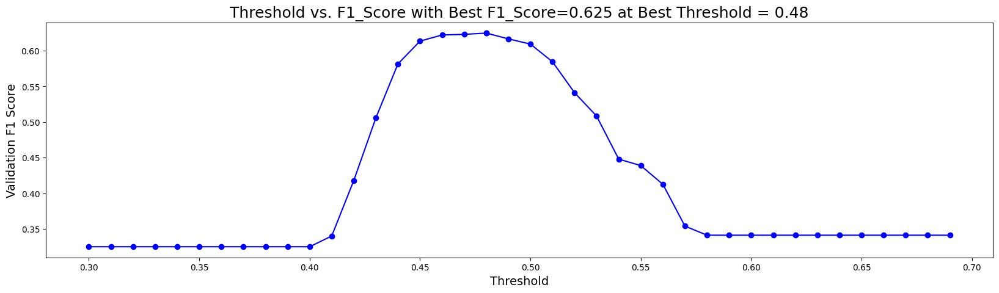

When using optimal threshold = 0.48...
Q0: F1 = 0.6245762179809141
==> Overall F1 = 0.6245762179809141
s
[I 2023-09-23 05:56:52,244] Trial 2 finished with value: 0.6245762179809141 and parameters: {'objective': 'binary', 'metric': 'binary_logloss', 'boosting_type': 'gbdt', 'num_iterations': 680, 'learning_rate': 0.0015686801904061078, 'random_seed': 42, 'num_leaves': 17, 'subsample': 0.7067202535597108, 'min_child_samples': 47, 'reg_alpha': 4.340705919339604, 'reg_lambda': 6.178052017714703, 'colsample_bytree': 0.5618244182989518, 'min_split_gain': 0.6507467847495357, 'max_depth': 6}. Best is trial 2 with value: 0.6245762179809141.


,mean
feature,
age,1166.6
cash_incoming_30days,943.6
time_gps_fix_shift_max_,631.0
latitude_std_,501.2
time_in_out_diff_min_,487.2
...,...
cluster_17_count_,0.0
cluster_16_count_,0.0
cluster_15_count_,0.0


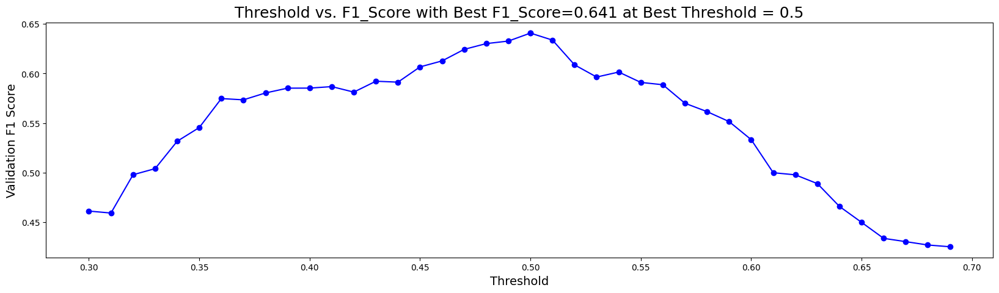

When using optimal threshold = 0.50...
Q0: F1 = 0.6408224863233352
==> Overall F1 = 0.6408224863233352
s
[I 2023-09-23 06:02:58,960] Trial 3 finished with value: 0.6408224863233352 and parameters: {'objective': 'binary', 'metric': 'binary_logloss', 'boosting_type': 'gbdt', 'num_iterations': 864, 'learning_rate': 0.0030865886095745366, 'random_seed': 42, 'num_leaves': 29, 'subsample': 0.38731248008969077, 'min_child_samples': 13, 'reg_alpha': 3.0076998663053973, 'reg_lambda': 1.1407296342736342, 'colsample_bytree': 0.845813193676909, 'min_split_gain': 0.047849423069860515, 'max_depth': 6}. Best is trial 3 with value: 0.6408224863233352.


,mean
feature,
age,581.4
cash_incoming_30days,278.4
time_gps_fix_shift_max_,39.2
longitude_std_,29.2
latitude_std_,14.8
...,...
cluster_22_count_,0.0
altitude_mean_,0.0
cluster_2_count_,0.0


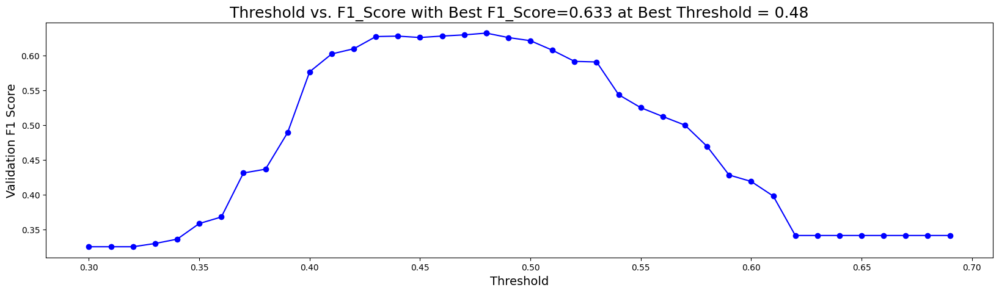

When using optimal threshold = 0.48...
Q0: F1 = 0.6326381524684812
==> Overall F1 = 0.6326381524684812
s
[I 2023-09-23 06:04:07,987] Trial 4 finished with value: 0.6326381524684812 and parameters: {'objective': 'binary', 'metric': 'binary_logloss', 'boosting_type': 'gbdt', 'num_iterations': 683, 'learning_rate': 0.004277147982680274, 'random_seed': 42, 'num_leaves': 14, 'subsample': 0.8711652722119598, 'min_child_samples': 38, 'reg_alpha': 7.546722267607043, 'reg_lambda': 2.9603211070899076, 'colsample_bytree': 0.8955428316050676, 'min_split_gain': 0.32618612619441656, 'max_depth': 0}. Best is trial 3 with value: 0.6408224863233352.


,mean
feature,
age,484.2
cash_incoming_30days,101.4
location_provider_count_local_database__,0.0
cluster_4_count_,0.0
cluster_5_count_,0.0
...,...
cluster_19_count_,0.0
cluster_1_count_,0.0
cluster_20_count_,0.0


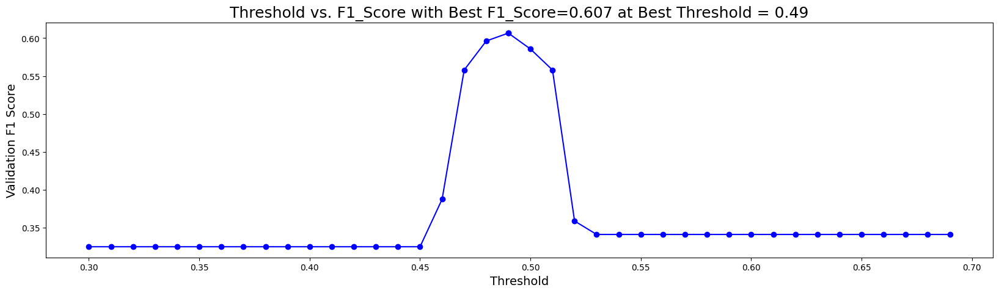

When using optimal threshold = 0.49...
Q0: F1 = 0.6066443128581961
==> Overall F1 = 0.6066443128581961
s
[I 2023-09-23 06:05:12,800] Trial 5 finished with value: 0.6066443128581961 and parameters: {'objective': 'binary', 'metric': 'binary_logloss', 'boosting_type': 'gbdt', 'num_iterations': 575, 'learning_rate': 0.0013738414982346014, 'random_seed': 42, 'num_leaves': 27, 'subsample': 0.23603681767830748, 'min_child_samples': 41, 'reg_alpha': 9.442662861675773, 'reg_lambda': 9.87626712354382, 'colsample_bytree': 0.5106740923853057, 'min_split_gain': 0.8262967209988971, 'max_depth': 2}. Best is trial 3 with value: 0.6408224863233352.


,mean
feature,
age,591.2
cash_incoming_30days,406.4
time_in_out_diff_std_,236.6
time_in_out_diff_max_,199.8
time_gps_fix_shift_max_,186.8
...,...
cluster_20_count_,0.0
cluster_21_count_,0.0
cluster_22_count_,0.0


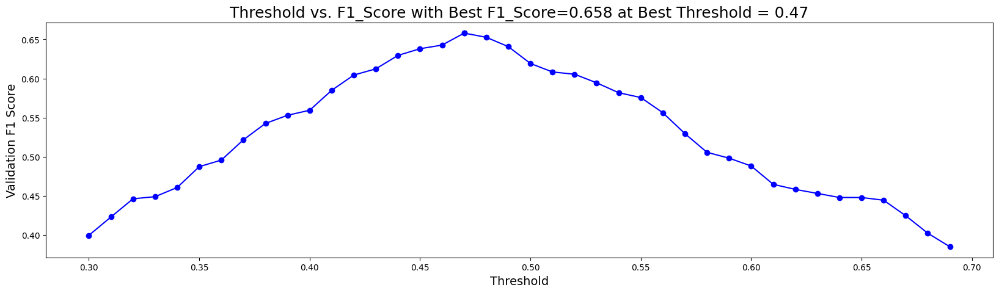

When using optimal threshold = 0.47...
Q0: F1 = 0.6579385524001005
==> Overall F1 = 0.6579385524001005
s
[I 2023-09-23 06:07:59,185] Trial 6 finished with value: 0.6579385524001005 and parameters: {'objective': 'binary', 'metric': 'binary_logloss', 'boosting_type': 'gbdt', 'num_iterations': 718, 'learning_rate': 0.00461132704132651, 'random_seed': 42, 'num_leaves': 21, 'subsample': 0.6311812266868806, 'min_child_samples': 8, 'reg_alpha': 3.572460404586728, 'reg_lambda': 0.7970512884694859, 'colsample_bytree': 0.3749139265085365, 'min_split_gain': 0.33138859267014986, 'max_depth': 8}. Best is trial 6 with value: 0.6579385524001005.


,mean
feature,
age,452.2
cash_incoming_30days,196.8
time_gps_fix_shift_max_,154.0
location_provider_count_fused__,43.0
latitude_std_,39.4
...,...
cluster_1_count_,0.0
cluster_19_count_,0.0
cluster_18_count_,0.0


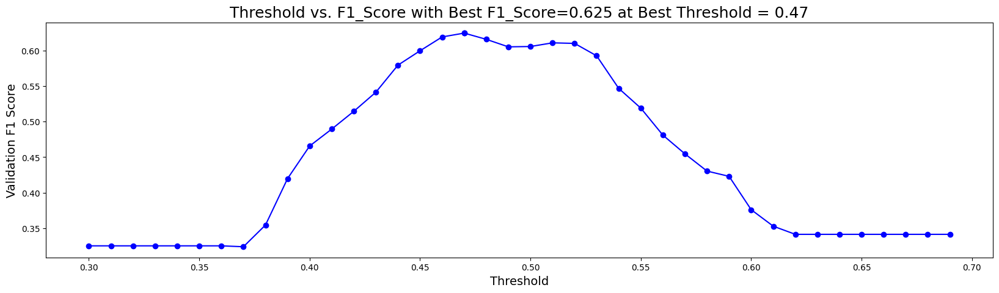

When using optimal threshold = 0.47...
Q0: F1 = 0.6245762179809141
==> Overall F1 = 0.6245762179809141
s
[I 2023-09-23 06:08:29,251] Trial 7 finished with value: 0.6245762179809141 and parameters: {'objective': 'binary', 'metric': 'binary_logloss', 'boosting_type': 'gbdt', 'num_iterations': 328, 'learning_rate': 0.0027179687137265534, 'random_seed': 42, 'num_leaves': 16, 'subsample': 0.6728420287607901, 'min_child_samples': 38, 'reg_alpha': 0.43193046469373947, 'reg_lambda': 8.799271830004642, 'colsample_bytree': 0.7869165284293129, 'min_split_gain': 0.8782185460821335, 'max_depth': 4}. Best is trial 6 with value: 0.6579385524001005.


,mean
feature,
age,507.6
cash_incoming_30days,334.2
latitude_std_,298.2
time_gps_fix_shift_max_,210.4
time_in_out_diff_max_,190.2
...,...
cluster_20_count_,0.0
cluster_21_count_,0.0
cluster_22_count_,0.0


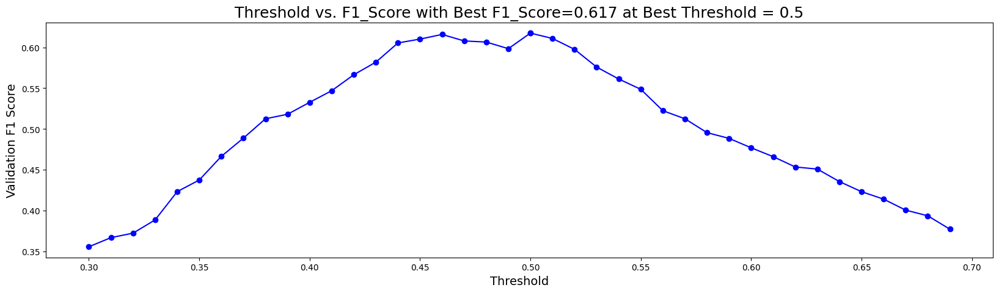

When using optimal threshold = 0.50...
Q0: F1 = 0.6174429019256605
==> Overall F1 = 0.6174429019256605
s
[I 2023-09-23 06:10:58,310] Trial 8 finished with value: 0.6174429019256605 and parameters: {'objective': 'binary', 'metric': 'binary_logloss', 'boosting_type': 'gbdt', 'num_iterations': 724, 'learning_rate': 0.0030538665096331535, 'random_seed': 42, 'num_leaves': 22, 'subsample': 0.33599409501875527, 'min_child_samples': 33, 'reg_alpha': 0.2549724207190106, 'reg_lambda': 3.0313225439496967, 'colsample_bytree': 0.31786828786317467, 'min_split_gain': 0.5580206104739815, 'max_depth': 5}. Best is trial 6 with value: 0.6579385524001005.


,mean
feature,
age,705.8
cash_incoming_30days,328.0
time_in_out_diff_std_,96.8
latitude_std_,96.0
time_gps_fix_shift_max_,77.8
...,...
cluster_1_count_,0.0
cluster_20_count_,0.0
cluster_21_count_,0.0


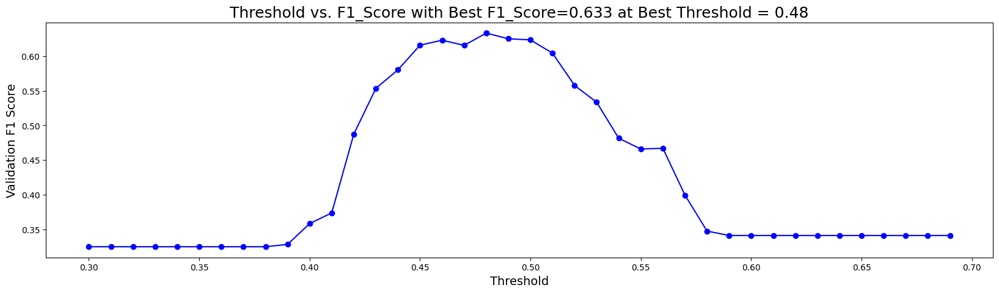

When using optimal threshold = 0.48...
Q0: F1 = 0.6329495420404512
==> Overall F1 = 0.6329495420404512
s
[I 2023-09-23 06:12:31,795] Trial 9 finished with value: 0.6329495420404512 and parameters: {'objective': 'binary', 'metric': 'binary_logloss', 'boosting_type': 'gbdt', 'num_iterations': 633, 'learning_rate': 0.0021711919051580365, 'random_seed': 42, 'num_leaves': 11, 'subsample': 0.9809372311818784, 'min_child_samples': 37, 'reg_alpha': 4.950991260193661, 'reg_lambda': 9.770830178500896, 'colsample_bytree': 0.49669644241059985, 'min_split_gain': 0.31895453267347224, 'max_depth': 5}. Best is trial 6 with value: 0.6579385524001005.
params {'objective': 'binary', 'metric': 'binary_logloss', 'boosting_type': 'gbdt', 'num_iterations': 718, 'learning_rate': 0.00461132704132651, 'random_seed': 42, 'num_leaves': 21, 'subsample': 0.6311812266868806, 'min_child_samples': 8, 'reg_alpha': 3.572460404586728, 'reg_lambda': 0.7970512884694859, 'colsample_bytree': 0.3749139265085365, 'min_split_ga

In [31]:
sampler = TPESampler(seed=10)
max_score = 0
experiment = optuna.create_study(direction='maximize', sampler=sampler)
experiment.optimize(lambda trial:objective_lgbm(trial),n_trials=10, show_progress_bar=True)
best_params = experiment.best_params
print(f'params {best_params}')
print(max_score)

,mean
feature,
age,591.2
cash_incoming_30days,406.4
time_in_out_diff_std_,236.6
time_in_out_diff_max_,199.8
time_gps_fix_shift_max_,186.8
...,...
cluster_20_count_,0.0
cluster_21_count_,0.0
cluster_22_count_,0.0


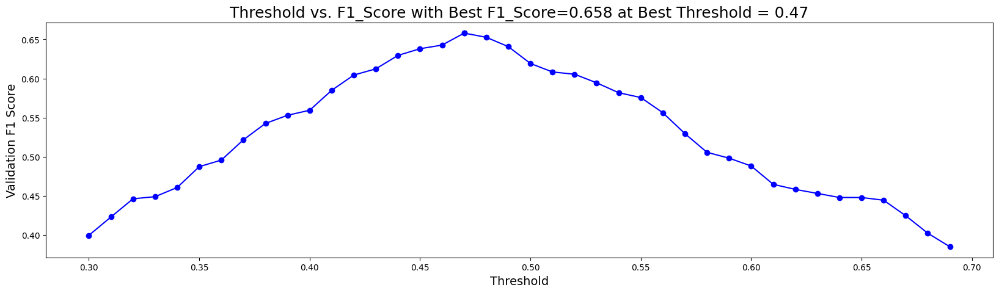

When using optimal threshold = 0.47...
Q0: F1 = 0.6579385524001005
==> Overall F1 = 0.6579385524001005
s


{0: LGBMClassifier(colsample_bytree=0.3749139265085365,
                learning_rate=0.00461132704132651, max_depth=8,
                metric='binary_logloss', min_child_samples=8,
                min_split_gain=0.33138859267014986, num_iterations=718,
                num_leaves=21, objective='binary', random_seed=42,
                reg_alpha=3.572460404586728, reg_lambda=0.7970512884694859,
                subsample=0.6311812266868806),
 1: LGBMClassifier(colsample_bytree=0.3749139265085365,
                learning_rate=0.00461132704132651, max_depth=8,
                metric='binary_logloss', min_child_samples=8,
                min_split_gain=0.33138859267014986, num_iterations=718,
                num_leaves=21, objective='binary', random_seed=42,
                reg_alpha=3.572460404586728, reg_lambda=0.7970512884694859,
                subsample=0.6311812266868806),
 2: LGBMClassifier(colsample_bytree=0.3749139265085365,
                learning_rate=0.00461132704132651, max_d

In [32]:
model = objective_lgbm(None, lgbm_params=best_params)
model

In [37]:
model[0].feature_importances_

array([ 53,   0,  69,  22,  96,  94,  34,  79, 104,  29,   0,   0,   0,
         3,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,  16,   0,
         0,   0,   0,   5,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0, 147, 111], dtype=int32)

- Above were the 5 models that were trained with best hyper paramters in Stratisfied KFold Cross Validation manner. We can choose any one random model out of it or use all 5 models for the infernce in the ensemble manner. I am going with the choosing one.

#### **Sample Input Data**

In [41]:
record = user_attributes_df.to_dict(orient="records")[0]
user_gps_fixes_df = user_gps_fixes[user_gps_fixes['user_id'] == 1]
del record['user_id']

1

In [50]:
# take data from three dataframes [user_attributes, loan_outcomes, gxf_fixes] combine as a single datafram and convert to json file
final = {
    "user_id": user_attributes_df['user_id'].iloc[0],
    "user_attributes": record,
    "user_gpx_fixes": user_gps_fixes_df.to_dict(orient="records"),
}

final

{'user_id': 1,
 'user_attributes': {'age': 42, 'cash_incoming_30days': 8988.12},
 'user_gpx_fixes': [{'id': 1,
   'gps_fix_at': '2017-06-22 09:37:20',
   'server_upload_at': '2017-06-22 09:43:42',
   'longitude': 36.8405401,
   'latitude': -1.2943417,
   'accuracy': 68.4,
   'altitude': 0.0,
   'bearing': 0.0,
   'location_provider': 'fused',
   'user_id': 1,
   'cluster': 5},
  {'id': 2,
   'gps_fix_at': '2017-08-14 07:50:27',
   'server_upload_at': '2017-08-14 09:05:27',
   'longitude': 36.8952702,
   'latitude': -1.3419282,
   'accuracy': 1409.0,
   'altitude': 0.0,
   'bearing': 0.0,
   'location_provider': 'fused',
   'user_id': 1,
   'cluster': 5},
  {'id': 3,
   'gps_fix_at': '2017-06-13 10:34:29',
   'server_upload_at': '2017-06-13 10:54:48',
   'longitude': 36.8119029,
   'latitude': -1.3072201,
   'accuracy': 68.4,
   'altitude': 0.0,
   'bearing': 0.0,
   'location_provider': 'fused',
   'user_id': 1,
   'cluster': 5},
  {'id': 4,
   'gps_fix_at': '2017-06-18 12:16:20',
   '

In [53]:
def default(o):
    if isinstance(o, np.int64):
        return int(o)  
    raise TypeError

with open(os.path.join(ROOT_FOLDER, "payload.json"), "w") as f:
    json.dump(final, f, default=default)
